<a href="https://colab.research.google.com/github/julianic6/DS595-Machine-Learning-for-Engineering-and-Science-Applications/blob/main/CaseStudy_1_Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Julia Nicolescu and Gabrielle Conard

DS 595 ST: Machine Learning for Engineering and Science Applications

February 1, 2024

# Polymer Melt Flow Rate

This case study is based upon the excellent example below:

http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate

Along with its github repository:

https://github.com/APMonitor/pds

and license:

https://github.com/APMonitor/pds/blob/main/LICENSE

In particular, as described on the web page above:

Polymer properties such as density, melt index, and melt flow rate must be kept within tight specifications for each grade. This case study is to analyze polymer production data to predict melt flow rate.

**Background:** There are gas phase and liquid slurry reactors that create polymers (polyethylene, polypropylene, polystyrene, and others) from chemical building blocks known as monomers (C2=, C3=, C4=, iC5=, and others). A catalyst is injected with the monomers under carefully controlled temperature and pressure conditions to cause a reaction that grows the polymer chains. Hydrogen is a chain transfer agent to stop the growth of the polymer chain. If the polymer chains grow too long then the polymer is too viscous for manufacturing in films, injection molding, or other applications.

This case study focuses on measurements of Melt Flow Rate (MFR) to determine the polymer viscosity based on reactor conditions. An accurate model is desirable so that the infrequent lab samples (every 2-8 hours) are supplemented with a virtual and continuous "soft sensor". A model that runs in real-time simulation alongside the physical reactor is called a digital twin.

| Label | Data File Tag   | Description |
|------|------|------|
|   Time  | | Timestamp of the measurements|
|   C3  | 513FC31103.pv| Propylene (C3=) Feed Rate (kg/hr)|
|   H2R  | 513HC31114-5.mv| Hydrogen to C3= Ratio|
|   Pressure  | 513PC31201.pv| Reactor Pressure (bar)|
|   Level  | 513LC31202.pv| Reactor Bed Level (m)|
|   C2  | 513FC31409.pv| Ethylene (C2=) Flow (kg/hr)|
|   Cat  | 513FC31114-5.pv| Catalyst Feed Rate (kg/hr)|
|   Temp  | 513TC31220.pv| Reactor Temperature|
|   MFR  | MFR| Melt Flow Rate (gm/10min)|

**References**

Hedengren, J. D. (2021, December 16). Polymer Melt Flow Rate, Machine Learning for Engineers. Retrieved from http://apmonitor.com/pds/index.php/Main/PolymerMeltFlowRate



# Naive solution

### Import Polymer MFR Data


Don't worry, the data has been cached on the github page for this class so you can access it directly by url. Easy!

In [172]:
url = 'https://raw.githubusercontent.com/rcpaffenroth/DS595-Machine-Learning-for-Engineering-and-Science-Applications/main/data/polymer_reactor.txt'

Let's read the data through pandas.  It would be great to get to know pandas. It is an important tool for Data Science in Python.

![Book cover](https://images-na.ssl-images-amazon.com/images/I/51HuYEwAl2L._SX258_BO1,204,203,200_.jpg)

https://images-na.ssl-images-amazon.com/images/I/51HuYEwAl2L._SX258_BO1,204,203,200_.jpg

In [173]:
import pandas as pd

# We can pass the url directly into pandas read_csv file
# to read a dataframe directly
data = pd.read_csv(url)

In [174]:
data

,Unnamed: 0,513FC31103.pv,513HC31114-5.mv,513PC31201.pv,513LC31202.pv,513FC31409.pv,513FC31114-5.pv,513TC31220.pv,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


What does all this mean? 513FC31103.pv	513HC31114-5.mv	513PC31201.pv	513LC31202.pv	513FC31409.pv	513FC31114-5.pv	513TC31220.pv.   What do the column labels mean?  You probably want to map them to something more meaningful.

![?](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR2W-Aq7YoFONiyUsix1x8wXnlesgqEyDShTA&usqp=CAU)

In [175]:
data = data.set_axis(['Time','C3','H2R','Pressure','Level','C2','Cat','Temp','MFR'], axis=1)

In [176]:
data

,Time,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
0,04-05-18 19:45,24856.584,0.153,30.414835,79.657906,50850.578,0.163994,80.399605,3.4
1,04-05-18 21:45,25537.250,0.153,30.527121,78.532608,42229.813,0.129739,78.861328,3.2
2,04-05-18 23:45,25689.266,0.153,30.356180,78.842636,45335.852,0.150003,78.818115,3.2
3,04-06-18 1:45,25098.754,0.153,30.894308,79.173500,43077.016,0.151543,79.022720,3.1
4,04-06-18 3:45,24853.941,0.150,30.680647,78.677299,40404.387,0.122582,79.038483,3.3
...,...,...,...,...,...,...,...,...,...
2559,12-10-18 9:45,24437.988,0.185,31.025928,77.189499,24022.730,0.103966,81.783371,12.3
2560,12/17/2018 16:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.5
2561,12/17/2018 18:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0
2562,12/27/2018 5:45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.7


Nice, now I know what they are. 🙂

## Regression Modeling

Now, we have the data and we know what they are. We learned a lot from Randy's 🧙 lecture and can't wait to try the machine learning algorithms. Let's start.

### Divide Data

What is the first step? Wow, Randy 🧙  said we need to divide the training set and the test set.

"Data is divided into train and test sets to separate a fraction of the rows for evaluating classification or regression models. A typical split is 80% for training and 20% for testing, although the range depends on how much data is available and the objective of the study."

The `train_test_split` is a function in `sklearn` for the specific purpose of splitting data into train and test sets.

```python
from sklearn.model_selection import train_test_split
train,test = train_test_split(ds, test_size=0.2, shuffle=True)
```

There are options such as `shuffle=True` to randomize the selection in each set.

One of those arguments is `random_state`; this argument, when set to a value, determines which rows go into the train and test splits. Make a mental note of the value we set, we may see it again later in the notebook! 🧙

In [177]:
from sklearn.model_selection import train_test_split

# note how we set the random_state
train,test = train_test_split(data, test_size=0.2, shuffle=True, random_state=1)

Can't wait any longer to run the model?


#### Run model
Let's try linear regression using sklearn!

In [178]:
from sklearn import linear_model
method = linear_model.LinearRegression()

What columns are used as features? What columns are used as labels?
Don't know? Then let's use them all first, except for time, since time is not important in this case.

**Features：**`C3, H2R, Pressure, Level, C2, Cat, Temp`

**label：** `MFR`


In [179]:
# We call method.fit() to learn the parameters of our network
# to the specific data
model = method.fit(
    X = train[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),
    y = train['MFR'].to_numpy())

ValueError: Input X contains NaN.
LinearRegression does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

ValueError: Input contains NaN????

![?](https://www.memecreator.org/static/images/memes/4724747.jpg)

Wow! We forgot to check if there are any null values in the dataset. 😞


`data.isnull()`  is used to check if there is null value in the dataset. We can sum them by using sum().

`data.info()` and `data.describe()` are usually used to check the properties and basic statistics of the data.

In [180]:
# Let's check how many total missing values exist in our training set
train.isnull().sum().sum()

431

In [181]:
# Let's do the same for the test set we made
test.isnull().sum().sum()

49

In [182]:
# use train.info() to get each column's number of non-missing values (Non-Null Count)
# Note: train.info() is also useful to see what kind a data type (Dtype) pandas
  # has encoded the columns. Sometimes pandas might mistakenly think a column of numbers
  # is actually a column of strings, so always check beforehand!
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1093 to 1061
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Time      2051 non-null   object 
 1   C3        1981 non-null   float64
 2   H2R       2048 non-null   float64
 3   Pressure  1979 non-null   float64
 4   Level     1979 non-null   float64
 5   C2        1979 non-null   float64
 6   Cat       1981 non-null   float64
 7   Temp      1979 non-null   float64
 8   MFR       2051 non-null   float64
dtypes: float64(8), object(1)
memory usage: 160.2+ KB


In [183]:
train.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR
count,1981.000000,2048.000000,1979.000000,1979.000000,1979.000000,1981.000000,1979.000000,2051.000000
mean,25342.035768,0.178165,30.659640,77.659450,42662.841313,0.138533,80.137342,8.229449
std,1701.939333,0.079322,0.432810,0.930477,11375.945853,0.042061,0.846325,5.084612
min,16106.025000,0.000000,26.946344,74.575958,9610.464800,0.022162,77.760117,1.500000
25%,24397.914000,0.135000,30.444627,76.994495,34932.478500,0.113763,79.666259,3.700000
50%,25394.648000,0.172000,30.618645,77.501343,41954.355000,0.132688,80.035500,4.400000
75%,26434.447000,0.200000,30.928010,78.233005,50109.232500,0.156993,80.497383,12.900000
max,30083.688000,0.980000,32.674332,83.841675,106073.610000,0.677979,91.566544,38.000000


Yes, null values do exist in the dataset, let's delete them first.

`data.dropna()` is used to remove the rows that contain at least one null value.

In [184]:
# assign new variables to versions of the data with no
# missing values
train_dropna = train.dropna()
test_dropna = test.dropna()

In [185]:
train_dropna.isnull().sum().sum()

0

In [186]:
test_dropna.isnull().sum().sum()

0

Now, let's try to run the model again!

In [187]:
model = method.fit(
    X=train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

Great!!! The model was successfully fit！ 🙂 Now, we can evaluate the performance on test set.

In [188]:
from sklearn.metrics import mean_squared_error
r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.42624499119957326
mse: 14.935927259730697


Ok, we already see things are interesting.  There are two different metrics (R^2 and mse)!   Hmmm....

## **Question 1** **(10 points)**

**Part 1 (5 points)**

What do R^2 and mse mean? Which is better for describing the performance of your algorithm?  Why?

__Answer__: R^2 is the measure of the ratio of the variance in the dependent variable (the variable we are predicting) compared to the independent variables (our inputs). R^2 explains the amount of variation that is accounted for by the model and is expressed as a value between 0 and 1. MSE is a measure of difference between the dependent variables being predicted and the actual values. MSE is computed using the average of the squared differences between predicted and actual data. For our model, MSE is better for describing the performance of our algorithm. This is because we are able to use MSE to assess the performance of the predictions done by the model. However, R^2 and MSE can both be used together to more effectively assess the performance of the model.

ChatGPT Referenced for this question. Prompts:
"difference between MSE and R^2 value" and "Is R^2 or mse a better assessment of a regression model"



**Part 2 (5 points)**  

Try different variables to fit the model and test its performance.   What do you notice?  Are some worse and some better?

Hint:
`model = method.fit(train_dropna[['Your selected variable 1', 'Your selected variable 2']].to_numpy(),train_dropna['MFR'].to_numpy())`

__Answer__:

We decided to train a model just using pressure and temperature as our independent variables based on their role in the speed of chemical reactions. However, this made the model worse. The MSE increased and the R^2 decreased.


In [189]:
model = method.fit(
    X=train_dropna[['Pressure','Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())


r2 = method.score(test_dropna[['Pressure', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())


print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.22836784385617925
mse: 20.087043387262355


Training and testing the model with just pressure as the independent variable did not change the R^2 or the MSE greatly compared to using both temperature and pressure.

In [190]:
model = method.fit(
    X=train_dropna[['Pressure']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())


r2 = method.score(test_dropna[['Pressure']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Pressure']].to_numpy()), test_dropna['MFR'].to_numpy())


print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.2019090680741491
mse: 20.775815327202643


Training and testing just using temperature made the model perform even worse, with a further increased MSE and decreased R^2.

In [191]:
model = method.fit(
    X=train_dropna[['Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())


r2 = method.score(test_dropna[['Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['Temp']].to_numpy()), test_dropna['MFR'].to_numpy())


print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.023702991262811945
mse: 25.414856311020774


Finally, we trained and tested a model with all variables except the catalyst. This would allow us to see the impact of the catalyst as a predictor of flow rate. The results were better than our last 3 tests, but not as good as when all the variables were used in the original model.

In [192]:
model = method.fit(
    X=train_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.3615460084012754
mse: 16.62016406120858


# Solution with Feature Engineering

How did you choose the variables? Why use these variables instead of others?

![?](https://media.makeameme.org/created/its-a-feature-5b167b.jpg)

How about we create a heatmap to show the correlation between the variables?

In [193]:
# import plotting libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px

Still remember? Removing null values.

In [194]:
data = data.dropna()

we can create a heatmap using `seaborn.heatmap()`

<ipython-input-195-4982c4d6cad5>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = data.corr()


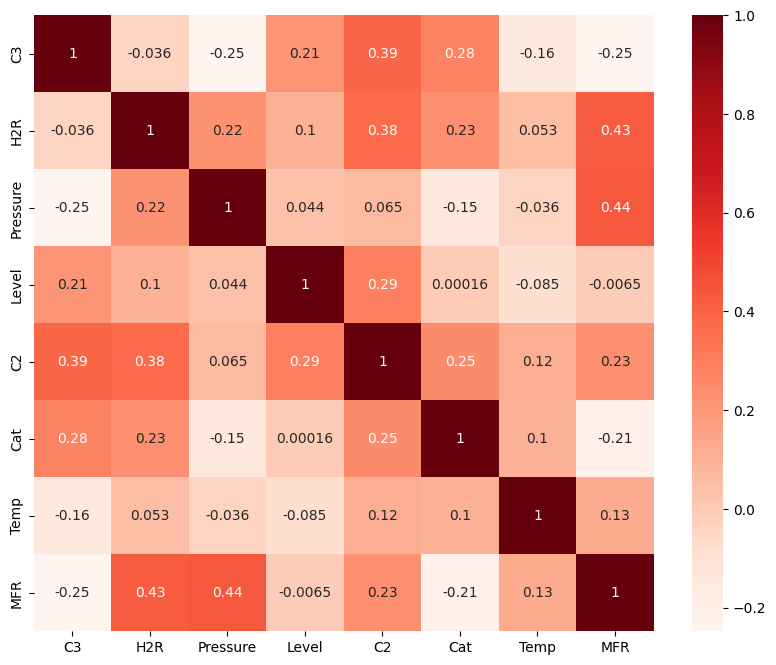

In [195]:
plt.figure(figsize=(10,8))
cor = data.corr()
sns.heatmap(cor, annot=True,cmap=plt.cm.Reds)
plt.show()

## **Question 2** **(20 points)**

**Part 1 (5 points)**
What does correlation mean?

__Answer__: Correlation considers 2 or more variables and the behavior of a given variable with respect to another. For example, as x increases, what does y do? Increase? Decrease? Remain constant? The correlation describes how closely linked the behavior of two variables are to each other.

**Part 2 (10 points)**
What are your observations? Which variables are strongly correlated with `MFR` and which variables are weakly correlated with `MFR`?

__Answer__: H2R and pressure are strongly correlated with MFR with values of 0.43 and 0.44 respectively. Level had the weakest correlation with MFR with a value of -0.0065. The C3 and catalyst variables showed small negative correlations with MFR with values of -0.25 and -0.21 respectively.


**Part 3 (5 points)**
Is a variable with a large *negative* correlation useful or not?

__Answer__: Yes. Negative correlations are still relevant in identifying patterns between variables. For example, the negative correlation between C3 and MFR shows us that they are inversely related, meaning that as C3 increases, MFR decreases and vice versa.


### Pair Plot

A pair plot shows the correlation between variables.

```python
sns.pairplot(data)
```

It has bar distributions on the diagonal and scatter plots on the off-diagonal. A pair plot also shows a different color (`hue`) by category `w`. Pair plots show correlations between pairs of variables that may be related and gives a good indication of features (explanatory inputs) that are used for classification or regression. Generate your own pair plot of the data.

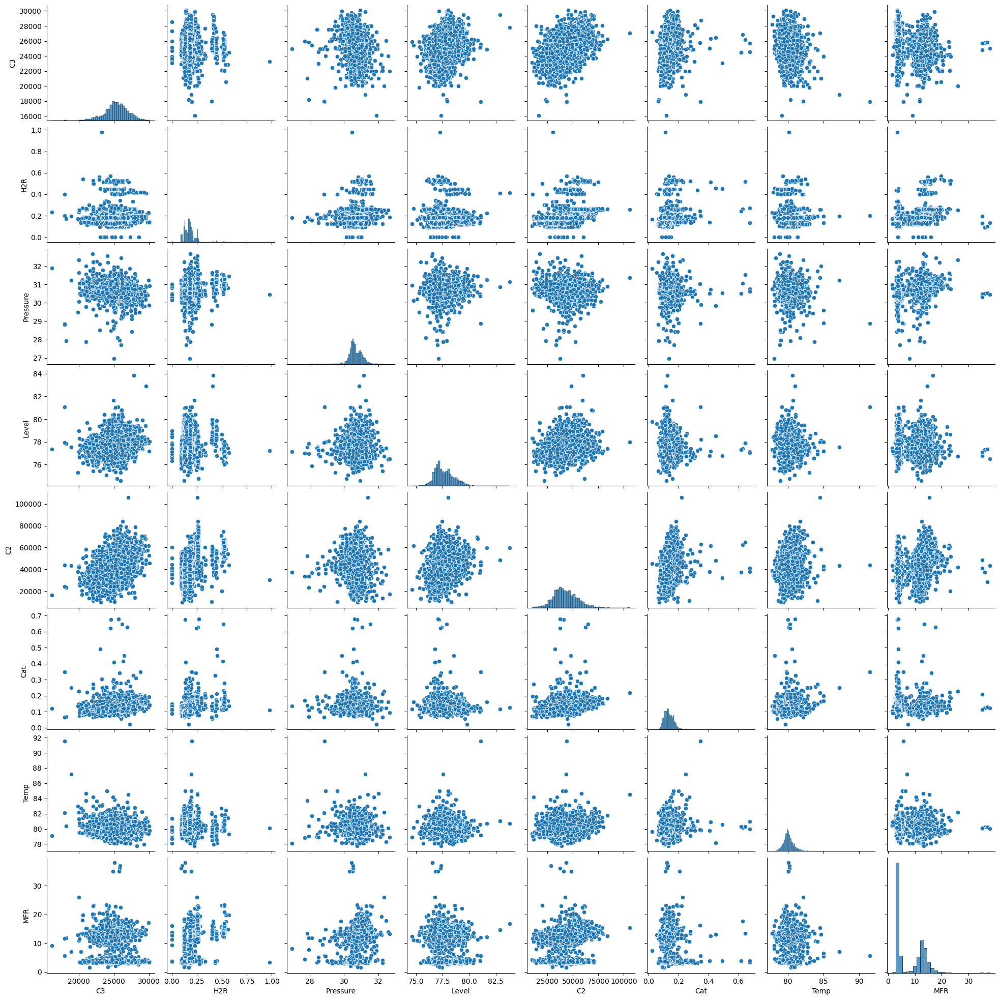

In [196]:
sns.pairplot(data) # This will run for a little bit

### Joint Plot

Want to change the plot style? No problem! 👌

A joint plot shows two variables, with the univariate and joint distributions.

```python
sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")
```

Generate your own joint plot with the data. Try `kind='reg'`, `'kde'`, and `'hex'` to see different joint plot styles.

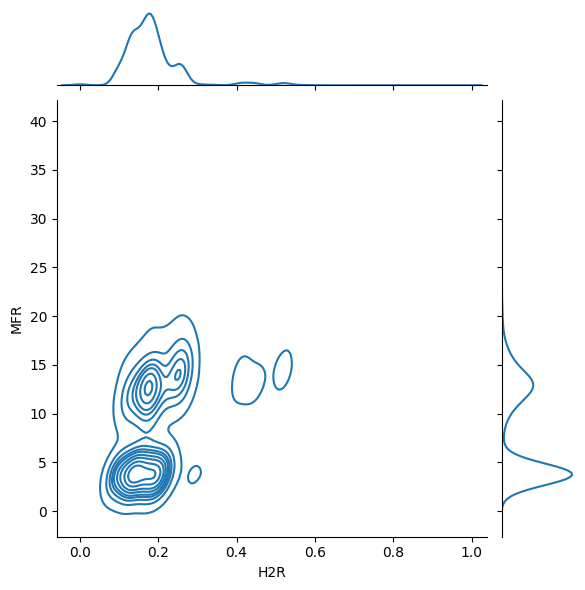

In [197]:
sns.jointplot(x='H2R',y='MFR',data=data,kind="kde")

### Data Analysis with `ydata-profiling` (formerly known as pandas-profiling)

ydata - Profiling is a data analysis tool for a more in-depth summary of the data than the `descibe()` function. [Install the package](https://docs.profiling.ydata.ai/latest/getting-started/installation/) with:

```python
pip install --user ydata-profiling[notebook]
jupyter nbextension enable --py widgetsnbextension
```

<!-- **This idea is important!** You will need to install more packages than Colab provides, and this is an example of doing that.

NOTE:  You need to restart the Kernel before proceeding. The install only needs to run once.  We will talk about this in class. -->

In [198]:
# first need to uninstall a conflicting version of a package,
# then install ydata-profiling
!pip uninstall typing-extensions -y
!pip install -U ydata-profiling[notebook] typing-extensions==4.6.0

# this line allows to use cool interactive widgets with a notebook
# which we will see in action in a few code cells below
!jupyter nbextension enable --py widgetsnbextension


Found existing installation: typing_extensions 4.6.0
Uninstalling typing_extensions-4.6.0:
  Successfully uninstalled typing_extensions-4.6.0
  Using cached ydata_profiling-4.6.4-py2.py3-none-any.whl (357 kB)
  Using cached typing_extensions-4.6.0-py3-none-any.whl (30 kB)
  Using cached pydantic-2.6.0-py3-none-any.whl (394 kB)
  Using cached typeguard-4.1.5-py3-none-any.whl (34 kB)
  Using cached annotated_types-0.6.0-py3-none-any.whl (12 kB)
  Using cached pydantic_core-2.16.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.2 MB)
INFO: pip is looking at multiple versions of pydantic to determine which version is compatible with other requirements. This could take a while.
  Using cached pydantic-2.5.3-py3-none-any.whl (381 kB)
  Using cached pydantic_core-2.14.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
  Using cached pydantic-2.5.2-py3-none-any.whl (381 kB)
  Using cached pydantic_core-2.14.5-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_

In [199]:
from ydata_profiling import ProfileReport

"Time" breaks the profiling. Remove this column from the data before generating your profile report.

In [200]:
data = data.drop(['Time'], axis=1)

In [201]:
# here we generate the big report
profile = ProfileReport(data, minimal=False)

ProfileReport takes a little time to render the results, please be patient. Next, we can view the report interactively with `profile.to_widgets()`

IMPORTANT NOTE: If you run the following cell and nothing appears, or you get some sort of warning message, try re-running the `profile = ProfileReport(data, minimal=False)` cell again, and then re-run `profile_to_widgets()` cell. The ProfileReport can be a little finicky with Colab.

In [202]:
# This will make nice interface in the notebook
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:507: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

View the profile report in the Jupyter Notebook with `profile.to_widgets()`.

## **Question 3** **(10 points)**

Notice that the output of the previous cell is a collection of interactive tabs that contain useful information about our data. Expore the tabs to get familiar with why type of information is present.

Next, find the two most "relevant" variables to `MFR` and fit them with linear regression. Cut and paste their "Interaction" plots here.  Why do you think they are relevant?


Compare the results (r^2 and mse) using these variables with your previous experiments.

__Answer__:
Based on the interaction maps, C2 and C3 are the most "relevant" variables due to the data having a larger spread across the maps. Their interactions maps with MFR are shown here:

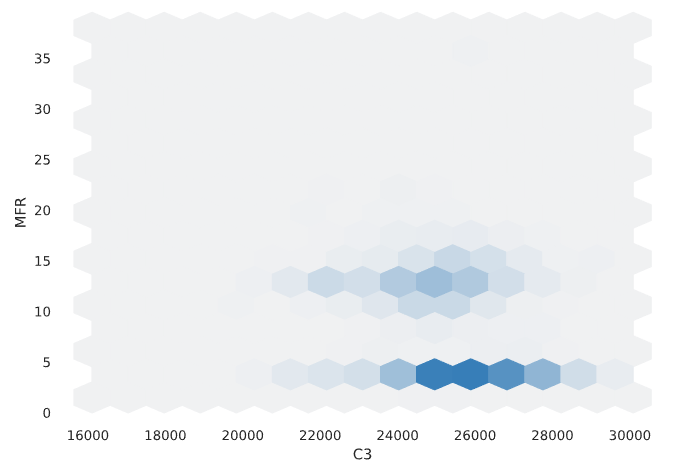

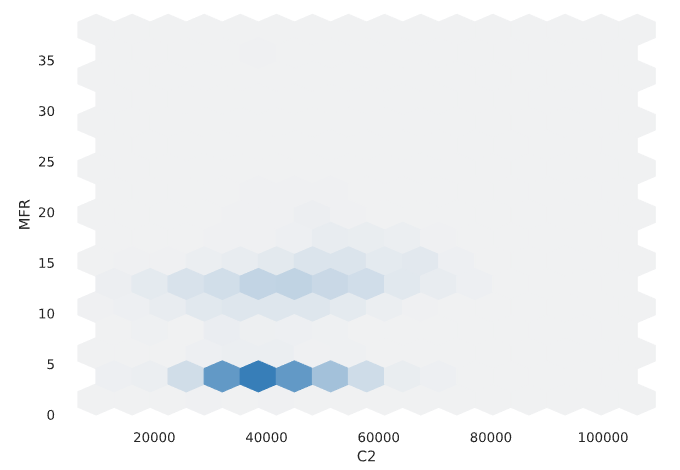


The models with just C2 and just C3 performed similarly, but C3 performed slightly worse with a higher MSE and lower R^2. We decided to also run the model using both C2 and C3 as our independent variables. This improved the performance of the model based on both the R^2 and the MSE slightly. This makes sense because the relationship between MFR and C2 or C3 does not follow a linear regression as shown by their interaction plots.

In [203]:
model = method.fit(
    X=train_dropna[['C2']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['C2']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C2']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))


model = method.fit(
    X=train_dropna[['C3']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['C3']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))


model = method.fit(
    X=train_dropna[['C2', 'C3']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())

r2 = method.score(test_dropna[['C2', 'C3']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C2', 'C3']].to_numpy()), test_dropna['MFR'].to_numpy())

print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.07107284206052467
mse: 24.18172956708496
R^2: 0.033830072880062345
mse: 25.151229236627387
R^2: 0.15846689340205755
mse: 21.906697238392315


Tired of manually selecting variables? We can use the model to select best features (variables) automatically.

### Select Best Features

We can rank the features to determine the best set that predicts `MFR`.

```python
from sklearn.feature_selection import SelectKBest, f_regression
best = SelectKBest(score_func=f_regression, k='all')
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)
```

There is additional information on [Select K Best Features](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html).

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


<BarContainer object of 7 artists>

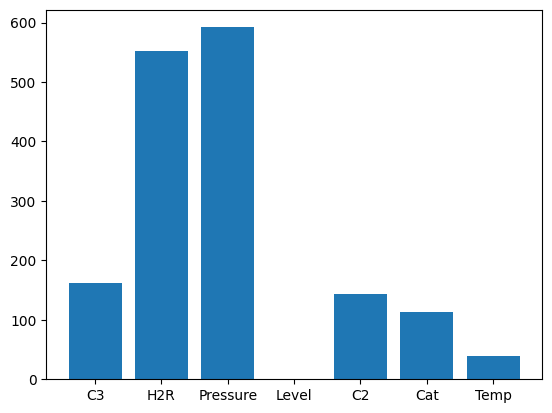

In [204]:
x=data[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']]
z=data[['MFR']]

# These are various feature selection algorithms available
from sklearn.feature_selection import SelectKBest, f_regression
import matplotlib.pylab as plt

# First, instantiate the selection algorithm with the scoring criteria
# here is the documentation on the scoring criteria we selected:
# https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html#sklearn.feature_selection.f_regression
best = SelectKBest(score_func=f_regression, k='all')

# fit the selection algorithm on our data and return
# the f-statistic for each variable; the higher the score,
# the more "significant" the variable is
fit = best.fit(x,z)
plt.bar(x=x.columns,height=fit.scores_)

## **Question 4** **(10 points)**

Based on the above results, select the variables you think are related to `MFR` and fit them with linear regression. Compare the results with the previous experiments.  What do observe?

__Answer__: Based on the selection algorithm, we identified that "Level" did not seem to be related to MFR, while all the other variables showed some degree of relation. Thus, we ran the linear regression model using all of the variables except Level. The performance of this model was extremely similar to the performance of the original model with all the variables. This makes sense because, as we can see here, Level has very little to no effect on MFR, so we would not expect that to impact the performance of the model significantly.


In [205]:
model = method.fit(
    X=train_dropna[['C3', 'H2R', 'Pressure', 'Cat', 'C2', 'Temp']].to_numpy(),
    y=train_dropna['MFR'].to_numpy())


r2 = method.score(test_dropna[['C3', 'H2R', 'Pressure', 'Cat', 'C2', 'Temp']].to_numpy(),test_dropna['MFR'].to_numpy())
mse = mean_squared_error(method.predict(test_dropna[['C3', 'H2R', 'Pressure', 'Cat', 'C2', 'Temp']].to_numpy()), test_dropna['MFR'].to_numpy())


print('R^2: ' + str(r2))
print('mse: ' + str(mse))


R^2: 0.4243496209397639
mse: 14.985267329789442


# Solution with Feature Engineering + Data processing

The result of the model is not good enough? Still want to improve the performance further?

Randy 🧙 has a few questions for you. Are there any outliers in the data? Do all variables satisfy the assumptions of the linear model?


There are several graphical techniques to help detect outliers. A box or histogram plot shows outlying points. Make one now and examine it for outliers in each variable.

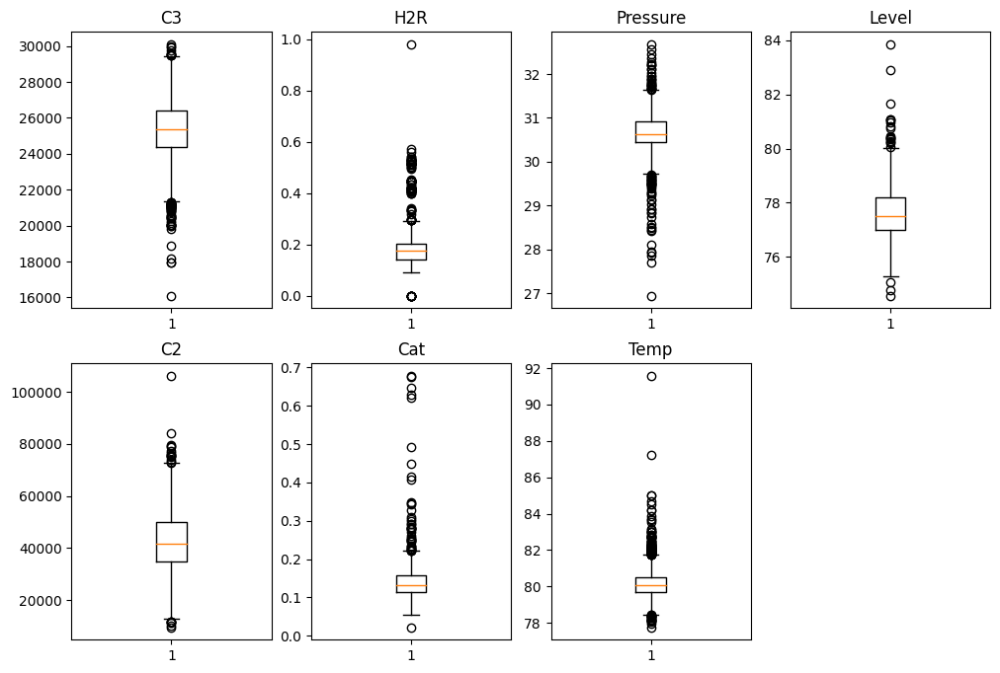

In [206]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

Remove outliers by removing select rows such as with:

```python
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]
```

to keep only values of `H2R` (Hydrogen to Monomer ratio) that are between 0.01 and 0.7.

In [207]:
data = data[data['H2R']<0.7]
data = data[data['H2R']>0.01]

Show the boxplot again to verify that the data set does not have the outliers you removed.

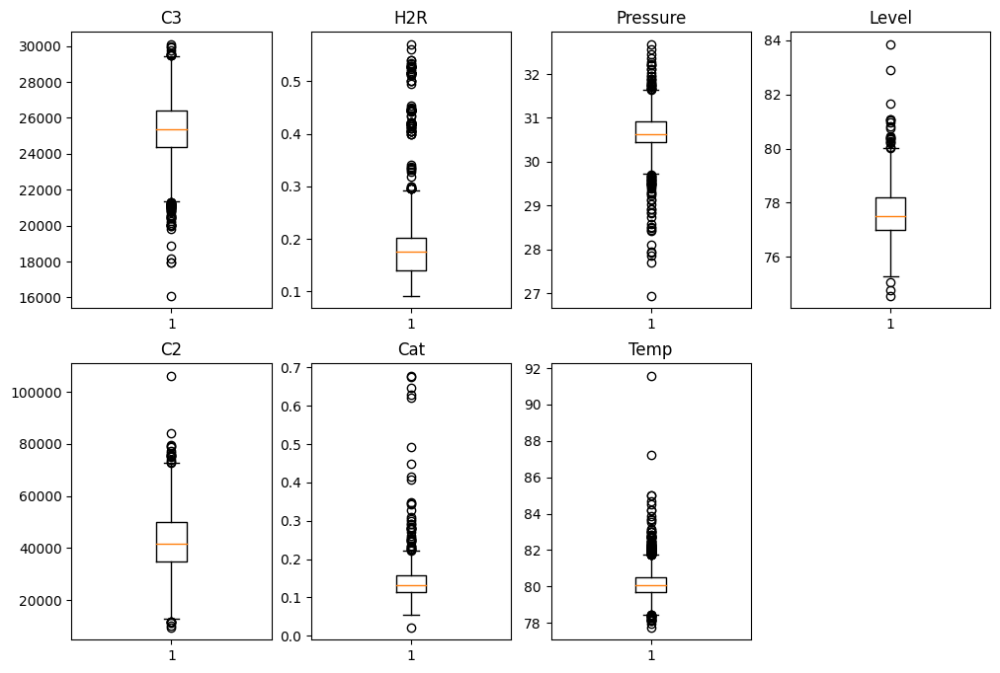

In [208]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))

# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()

## **Question 5** **(10 points)**

Are there any other outliers in other variables? If so, please remove them.  How did you go about defining outliers?

__Answer__: The whiskers of box and whisker plots connect to the minimum and maximum points. Points that lie far outside of these whiskers can be considered to be outliers. There are other statistical methods for deciding outliers, but for this case study, we will rely on how far away the extreme points appear from the whiskers. We are specifically identifying points that do not appear to be a part of a cluster and are far outside of the whiskers.

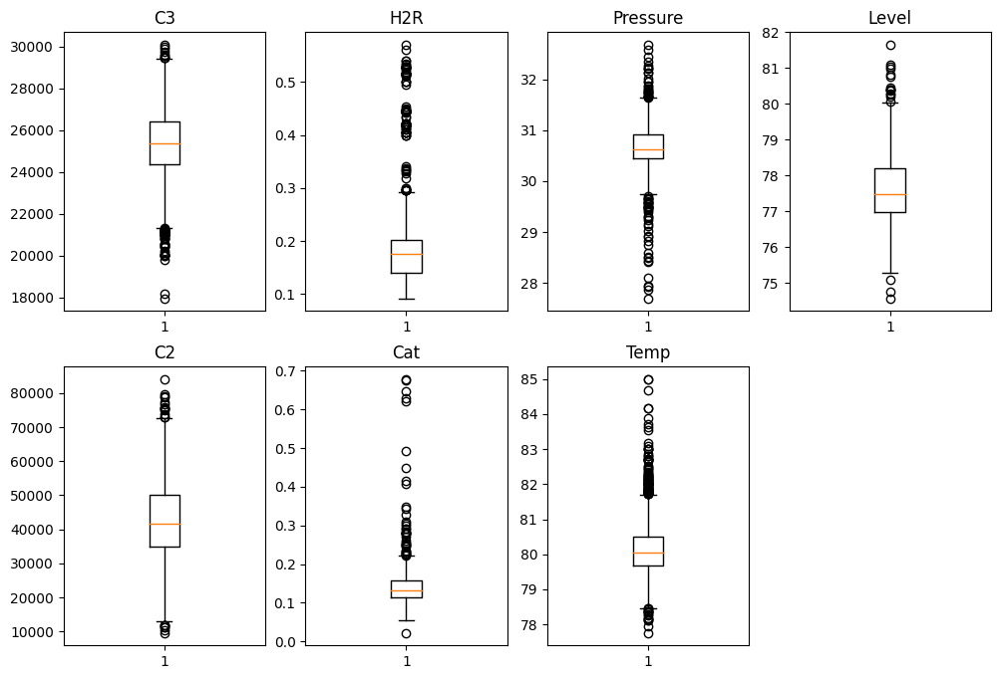

In [209]:
# Outliers in C3 data
data = data[data['C3']>17000]

# Outliers in Pressure data
data = data[data['Pressure']>27]

# Outliers in Level data
data = data[data['Level']<82]

# Outliers in C2 data
data = data[data['C2']<100000]

# Outliers in Temp data
data = data[data['Temp']<86]

# Plot data
plt.figure(figsize=(12,8))
# iterate over all of the columns
for i,c in enumerate(data.columns):
    if c != "MFR":
        plt.subplot(2,4,i+1)
        plt.title(c)
        plt.boxplot(data[c])
plt.show()


# Important question!

Who controls the features that you process?  Are you stuck with the features provided by the original experiment?

**NO!!!!**

You have the power!  For example, any invertible transformation of the data can lead to new features or even new targets!   Actually any transformation whatsoever can lead to new features and targets.  Invertible just means that you can always recover your original data :-)

For example, we can apply log transformation to `MFR` and try and predict that instead.  Since the log is invertible, we can just predict that, get an prediction, and then apply the inverse of the log (the exponential map).

Create a new column for the natural log of (`MFR`) as `lnMFR`.

In [210]:
import numpy as np
data['lnMFR'] = np.log(data['MFR'])

Check the results after log transformation

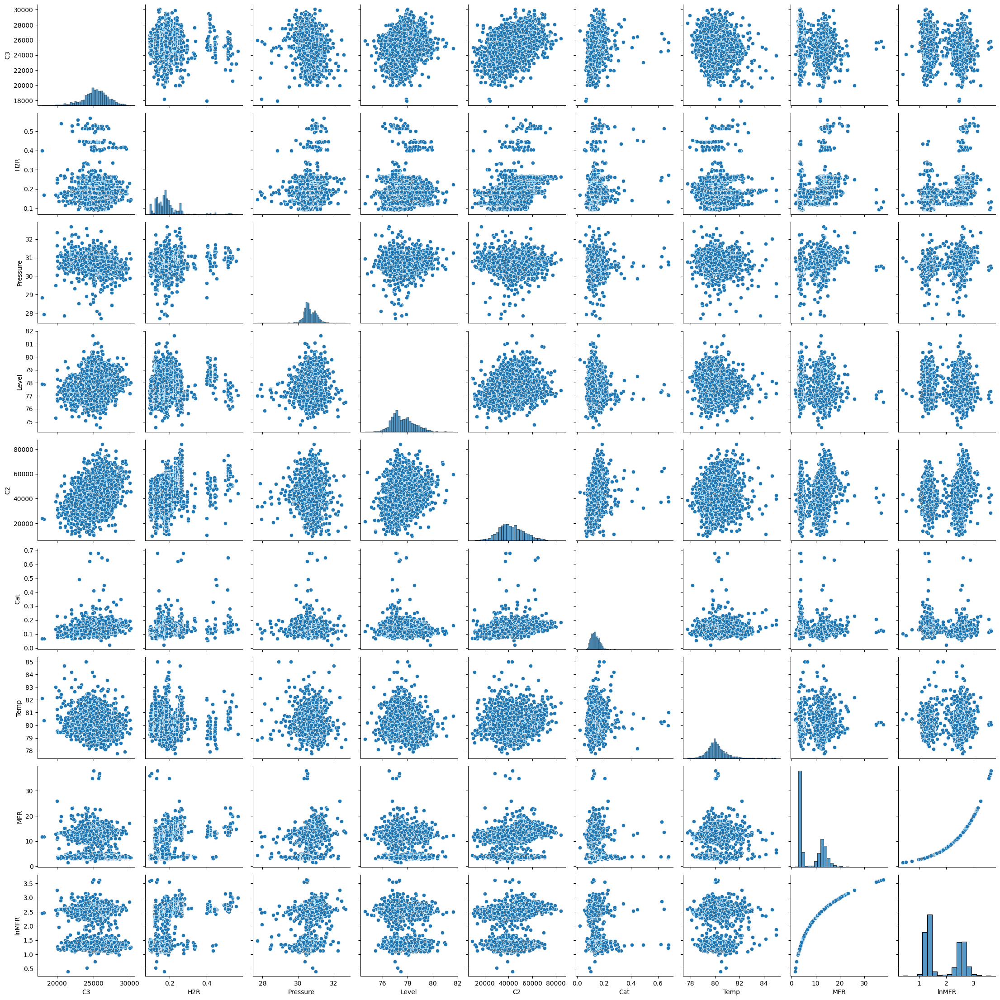

In [211]:
sns.pairplot(data)

## **Question 6** (10 points)

Pick one or two different functions and apply the to `MFR` and see if a transformed `MFR` is easier to predict.  Does transforming `MFR` change what inputs give good predictions?

__Answer__: The two transformations that we chose were the square root of MFR and the square of MFR. Taking the square root of MFR led to similar results as taking the log of MFR. As shown by our plots in both cases the Y-values (MFR) were made smaller and this allowed us to better see the two groups of data in the plots. Squaring MFR had an opposite effect, making the Y-values (MFR) much larger and causing the data to be compressed, showing very little difference between the two groups and showing the bottom group of data along one line instead of a cluster. It seems that transforming the MFR values to be smaller is better for predictions.


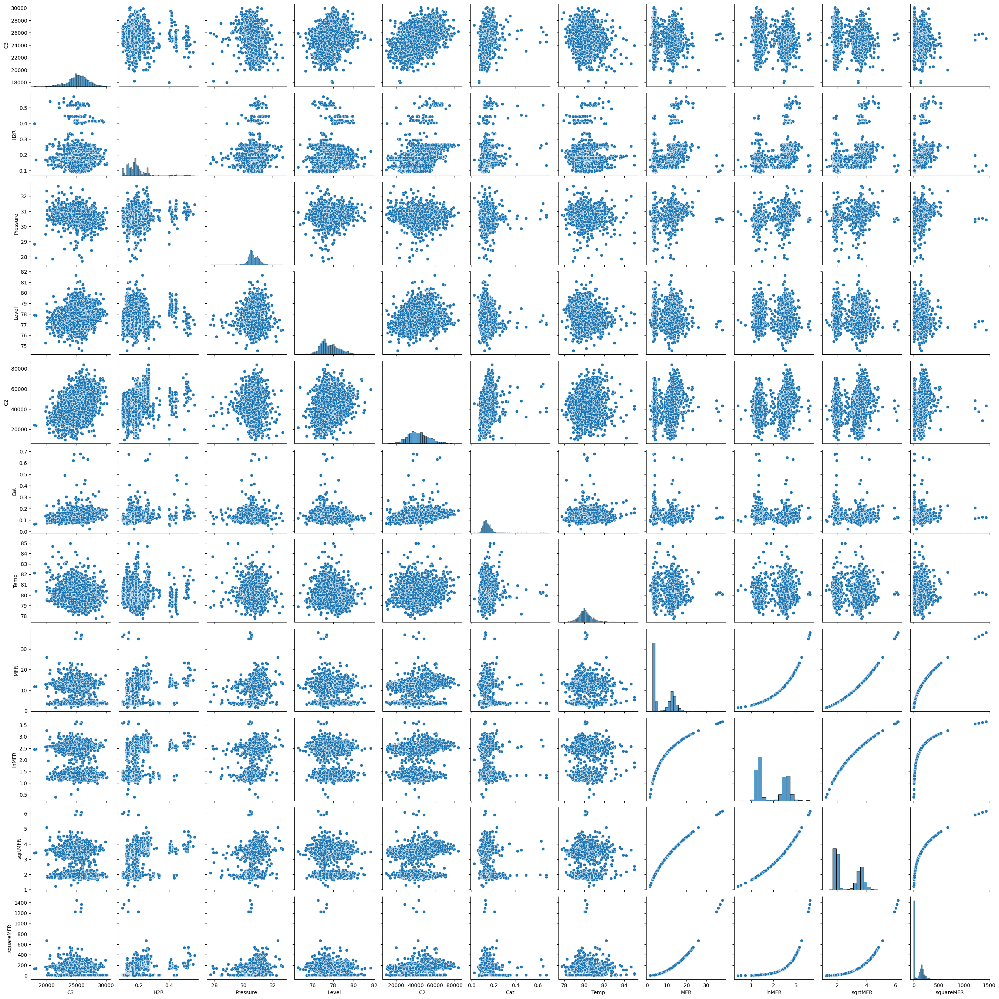

In [212]:
# Square rooting MFR
data['sqrtMFR'] = np.sqrt(data['MFR'])

# Squaring MFR
data['squareMFR'] = (data['MFR'])**2

# Plot
sns.pairplot(data)


## **Question 7** (10 points)

Just like using transformations on the target (`MFR` in this case), you can use transformations on the inputs. Can you predict a transformed `MFR` from a set of transformed inputs?

Ok, things start to explode now with so many combinations. Just try a few :-)

__Answer__: Our first combination was taking the square root of C3 and the square root of MFR. The plot from square rooting C3 and MFR showed a similar result to when just MFR was square rooted. However, the data seemed to be more compressed in the x direction. This makes sense, since square rooting the C3 data compressed the data. Using these transformed values performed better than when the original  C3 and MFR values were used, as we can better see the groupings in the data after applying the transformations.

The second combination was taking the square root of Pressure and the square root of MFR. We chose to experiment with pressure since we originally thought that pressure was strongly correlated to MFR based on the correlation analyses performed. Using the square root of pressure and MFR allowed us to better see the clusters of data, but it was not significantly different than the original plot comparing pressure and MFR.

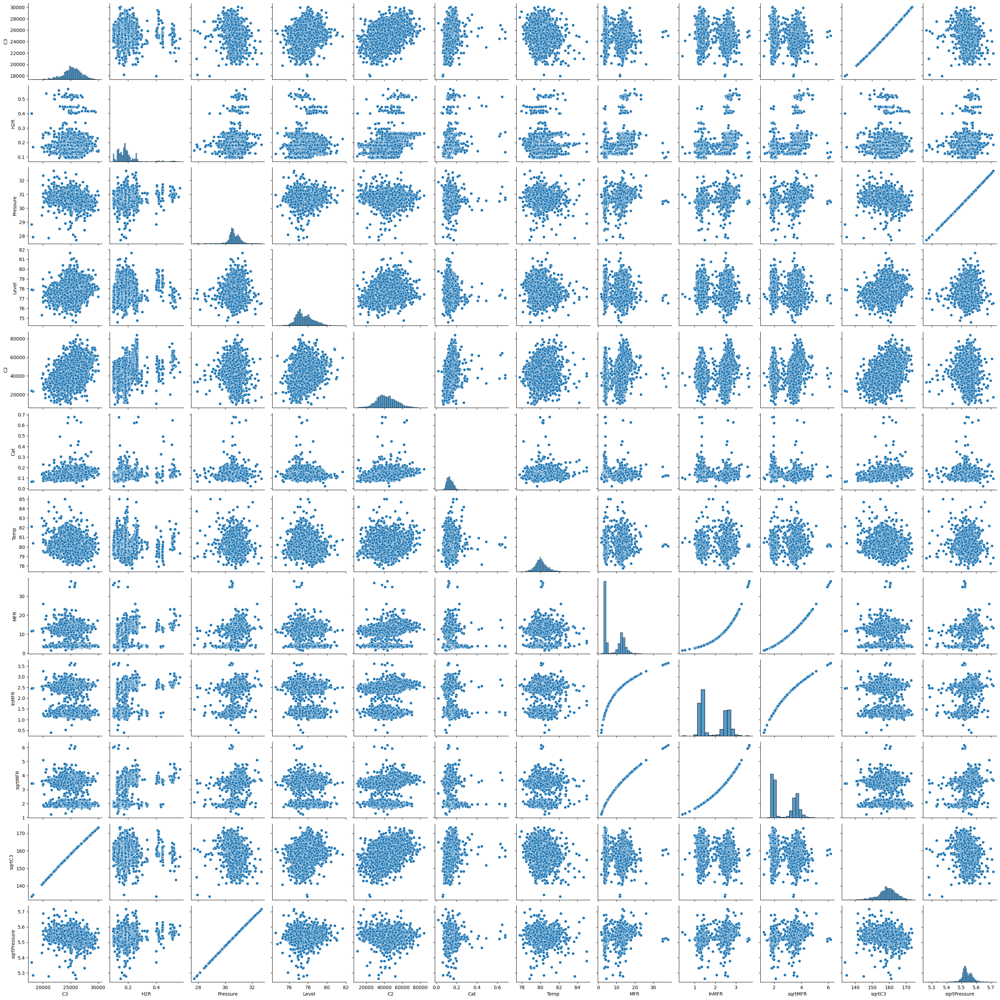

In [213]:
# Drop column containing the square of MFR data, since we won't be using it
data.drop(['squareMFR'], axis = 1, inplace = True)

data.describe()

# Square root C3 data and add a new column
data['sqrtC3'] = np.sqrt(data['C3'])

# Square root Pressure data and add a new column
data['sqrtPressure'] = np.sqrt(data['Pressure'])

sns.pairplot(data)


### One important transformation:  Scaling the data

Scale data with the `StandardScalar` from `scikit-learn`. This has the effect of making each column have zero mean and have unit variance.

```python
from sklearn.preprocessing import StandardScaler
s = StandardScaler()
ds = s.fit_transform(data)
```

In [214]:
from sklearn.preprocessing import StandardScaler
# like most methods in sklearn, we first instantiate the algorithm
s = StandardScaler()

# then can use a shortcut function to fit and transform the data of interest
ds = s.fit_transform(data)

The value `ds` is returned as a `numpy` array so we need to convert it back to a `pandas` `DataFrame`.

```python
ds = pd.DataFrame(ds,columns=data.columns)
```

Re-use the column names from `data`.

In [215]:
ds = pd.DataFrame(ds,columns=data.columns)

Now, we can check the results before/after scaling.

In [216]:
data.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,sqrtMFR,sqrtC3,sqrtPressure
count,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000,2465.000000
mean,25312.278102,0.183976,30.664468,77.646016,42518.549676,0.138498,80.137150,8.023408,1.879872,2.694609,159.008811,5.537423
std,1684.015706,0.069230,0.414947,0.903933,11265.255802,0.041690,0.771590,5.077506,0.636111,0.873384,5.337378,0.037570
min,17951.568000,0.092000,27.701582,74.575958,9610.464800,0.022162,77.760117,1.500000,0.405465,1.224745,133.983462,5.263229
25%,24363.402000,0.140000,30.445761,76.988380,34795.277000,0.113766,79.678993,3.700000,1.308333,1.923538,156.087802,5.517768
50%,25366.314000,0.175000,30.621395,77.494286,41564.641000,0.133044,80.044281,4.300000,1.458615,2.073644,159.268057,5.533660
75%,26397.199000,0.202000,30.924482,78.209373,50011.273000,0.157241,80.495415,12.700000,2.541602,3.563706,162.472148,5.560979
max,30083.688000,0.570000,32.674332,81.649261,84018.063000,0.677979,84.992203,38.000000,3.637586,6.164414,173.446499,5.716147


In [217]:
ds.describe()

,C3,H2R,Pressure,Level,C2,Cat,Temp,MFR,lnMFR,sqrtMFR,sqrtC3,sqrtPressure
count,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03,2.465000e+03
mean,-4.612042e-17,-1.153011e-16,-2.467443e-15,-1.236027e-14,2.767225e-16,1.383613e-16,-1.637275e-15,2.421322e-16,-4.150838e-16,-1.960118e-16,-1.014649e-15,-8.589928e-15
std,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00,1.000203e+00
min,-4.371814e+00,-1.328829e+00,-7.141852e+00,-3.397023e+00,-2.921794e+00,-2.791043e+00,-3.081321e+00,-1.285027e+00,-2.318316e+00,-1.683295e+00,-4.689648e+00,-7.299720e+00
25%,-5.635747e-01,-6.353496e-01,-5.271803e-01,-7.276748e-01,-6.857225e-01,-5.933471e-01,-5.939042e-01,-8.516554e-01,-8.986721e-01,-8.830333e-01,-5.473851e-01,-5.232802e-01
50%,3.209404e-02,-1.296875e-01,-1.038256e-01,-1.678891e-01,-8.469424e-02,-1.308416e-01,-1.203856e-01,-7.334631e-01,-6.623725e-01,-7.111316e-01,4.858161e-02,-1.001849e-01
75%,6.443770e-01,2.603949e-01,6.267467e-01,6.233557e-01,6.652529e-01,4.496645e-01,4.644141e-01,9.212282e-01,1.040486e+00,9.952934e-01,6.490152e-01,6.270960e-01
max,2.833927e+00,5.577071e+00,4.844650e+00,4.429596e+00,3.684598e+00,1.294277e+01,6.293548e+00,5.905001e+00,2.763781e+00,3.973635e+00,2.705564e+00,4.758051e+00


Note how the mean of each column is practically equal to 0, and the standard deviation is practically equal to 1.



Next, we resplit the processed dataset into training and test set.

**Set a same random_state=1 to ensure the splitting of data in this step is the same as the splitting of data in the step earlier in the notebook.**

NOTE:  We will come back to this important point later 🧙

In [218]:
from sklearn.model_selection import train_test_split
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1)

## **Question 8** (10 points)

Using the trained data to train the linear regression model, and report the results. Do models perform better? Why?

__Answer__: We previously identified that we thought MSE is a strong indicator for the performance of a linear regression model, so these results indicate that scaling the data greatly improved performance of the model fit. This is because scaling the data prevents the model fitting algorithm from falsely assigning more weight to an independent variable just because it has larger values than other variables.

However, we were surprised to see such a large decrease in the MSE for this updated model, but not a proportional increase in R^2. Scaling improved the MSE, but did not significantly improve the R^2.

Hint:
```python
method = linear_model.LinearRegression()

model = method.fit(train_processed[['variable 1','variable 2']].to_numpy(),train_processed['MFR'].to_numpy())

r2 = method.score(test_processed[['variable 1','variable 2']].to_numpy(),test_processed['MFR'].to_numpy())

mse = mean_squared_error(method.predict(test_processed[['variable 1','variable 2']].to_numpy()), test_processed['MFR'].to_numpy())

print('R^2: ' + str(r2))

print('mse: ' + str(mse))
```

In [219]:
method = linear_model.LinearRegression()
model = method.fit(train_processed[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),train_processed['MFR'].to_numpy())


r2 = method.score(test_processed[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy(),test_processed['MFR'].to_numpy())

mse = mean_squared_error(method.predict(test_processed[['C3', 'H2R', 'Pressure', 'Level', 'C2', 'Cat', 'Temp']].to_numpy()), test_processed['MFR'].to_numpy())


print('R^2: ' + str(r2))
print('mse: ' + str(mse))

R^2: 0.4525870641135701
mse: 0.5596361166089481


# More advanced solution

Want to learn more? Let's look at a more advanced solution.

![?](https://i.imgflip.com/2l2aus.jpg)

Let's try a count plot to show the number of binned samples of `lnMFR`.

<Axes: xlabel='lnMFR', ylabel='count'>

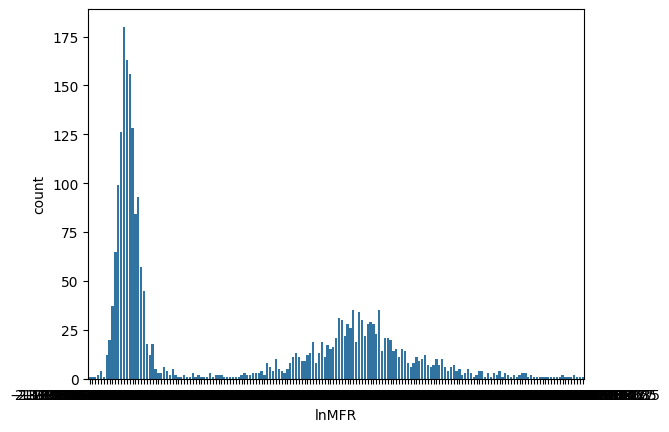

In [220]:
sns.countplot(x=ds['lnMFR'])

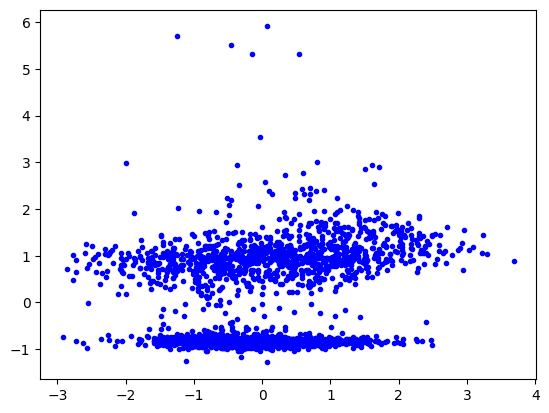

In [221]:
plt.plot(ds['C2'], ds['MFR'],'b.')

Note the interesting distribution of the data- it has a multimodal Gaussian distribution, in this case with two peaks.

Why not split the data into two parts, one for each Gaussian, then perform regression on each part separately? Will this regression perform better than a single regression algorithm for the full dataset?

First we split the data into two parts, then make train/test splits of each part with

In [222]:
from sklearn.model_selection import train_test_split
lower_data = ds[ds['lnMFR']<0]
upper_data = ds[ds['lnMFR']>0]
lower_train,lower_test = train_test_split(lower_data, test_size=0.2, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.2, shuffle=True,random_state=1)

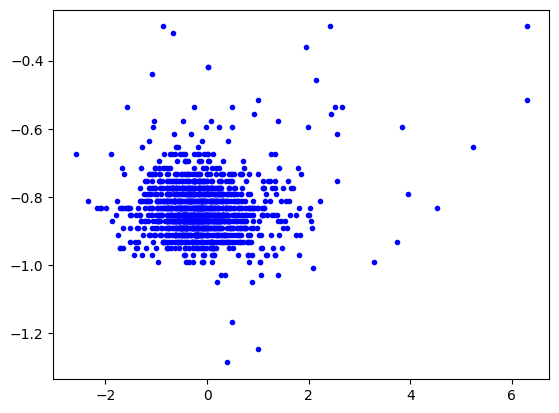

In [223]:
plt.plot(lower_data['Temp'], lower_data['MFR'],'b.')

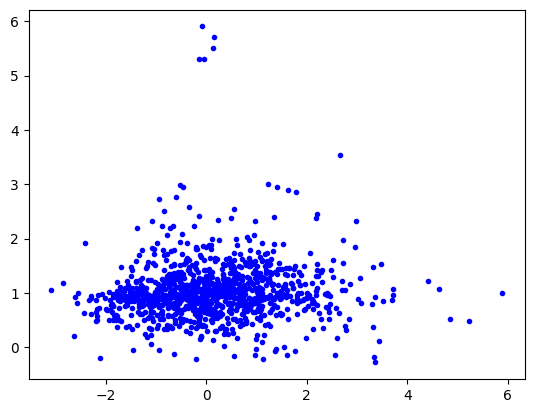

In [224]:
plt.plot(upper_data['Temp'], upper_data['MFR'],'b.')

Run the following code to test linear regression on the full data set as well as the subsets.

In [225]:
def fits(data):
    X = ['Temp']
    y = ['MFR']
    # change this if you applied log transformation to your selected variables.
    method = linear_model.LinearRegression()

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())

    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))

    plt.plot(data[X[0]], data[y],'b.', label="Real Data")
    plt.plot(data[X[0]], MFR_pred,'r.', label="Predictions")
    plt.legend()


    return

R^2: -94.19706818617627
mse: 38.50462121203326


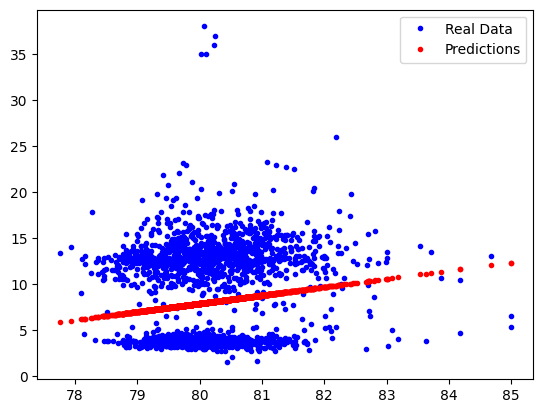

In [226]:
fits(data)

R^2: -0.04662565810914465
mse: 0.032189125907407294


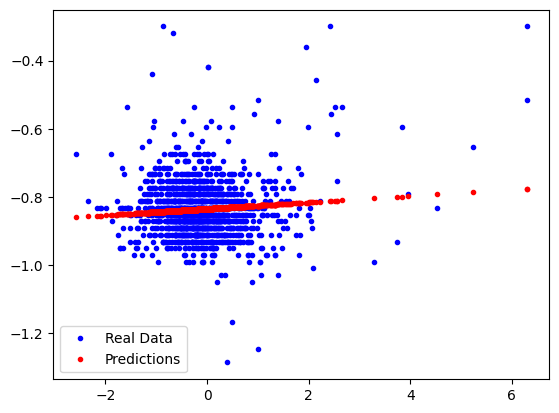

In [227]:
fits(lower_data)

R^2: -0.027949289346102857
mse: 0.08737236182911821


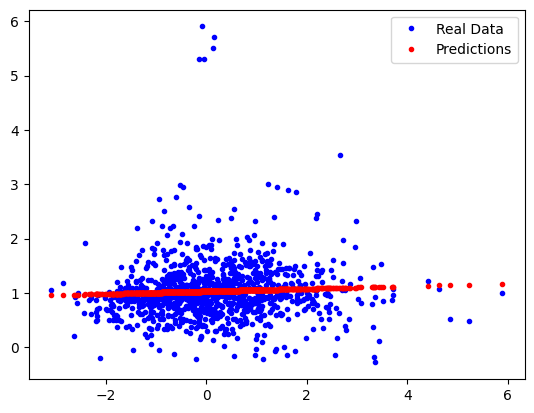

In [228]:
fits(upper_data)

## **Question 9** (10 points)

Explain what is going on here?  Was it ever a good idea to use linear regression on the whole dataset!?  In particular, what does it mean that the R^2 and mse changed so much?

__Answer__: The above code separated the data into two sets based on each Gaussian distribution. Then, it ran the linear regression model for each set and for the combined set.

No, it was never a good idea to use linear regression on the whole dataset. This is because the dataset simply isn't linear. However, splitting the data and then applying a linear regression was also not a good idea. This is because you are missing the overall trends and relationships shown in the whole data set. This could lead to overfitting. While the MSE values of the split models suggest that they perform signficantly better than the model from the combined dataset, the R^2 values suggest that this is misleading. First, the R^2 value for the overall data does not appear correct here given that it is -94. In addition, the R^2 values for the split datasets were small, negative numbers (close to 0) and this indicates that the linear regression is not a good fit. This indicates that a decrease in MSE alone is not a strong indication of improved model performance. The initial assumption is that the model greatly improved when splitting the data, but this really led to overfitting the model and is not representative of the system behavior.  


## **Question 10** **($\infty$ points, since this is where you really learn stuff! :-)**

You can get as many points of extra credit as you like by doing a good job with this question!

Play around with doing a better analysis.  Things to try:

1.   Redo the calculations, but start from the split dataset above.
2.   Try different train and test splits and see if the answer changes (i.e.,
```
train_processed,test_processed = train_test_split(ds, test_size=0.2, shuffle=True, random_state=1234)
```
3.   Try different methods such as `linear_model.LinearRegression()`, `KNeighborsRegressor(n_neighbors=20)`, `linear_model.Ridge()`, `linear_model.Lasso()`, or `linear_model.BayesianRidge()`. Can you achieve better performance than any of the previous models?

4.  Answer the following question carefully:  What is the problem with using this method of selecting a model based on its performance on testing data?


__Solution to Part 1:__

For the rest of Question 10, we used the split dataset.

__Solution to Part 2:__

We assigned new train and test splits, as shown below.

Something we noticed was that we needed to use "lower_train" and "upper_train", instead of "lower_data" and "upper_data" as shown in Question 9, since that is where the training and testing data is split. We noticed this from changing the train and test splits, passing "lower_data" and "upper_data" to fit(), and seeing that there were no changes in the results.

In [229]:
# 60% training and 40% testing
lower_data = ds[ds['lnMFR']<0]
upper_data = ds[ds['lnMFR']>0]
lower_train,lower_test = train_test_split(lower_data, test_size=0.4, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.4, shuffle=True,random_state=1)

R^2: -0.04479842777569987
mse: 0.03483163447373076


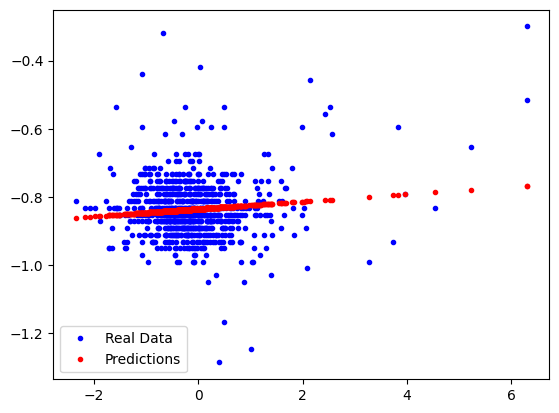

In [230]:
fits(lower_train)

R^2: -0.014665733693421945
mse: 0.0954460592041313


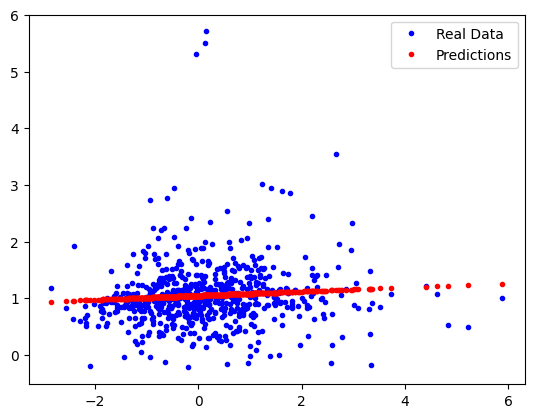

In [231]:
fits(upper_train)

The MSE values increased slightly. This makes sense since we provided the model with less data to train on, decreasing performance.

We also decided to explore the split dataset based on H2R instead of Temp.

In [232]:
lower_train,lower_test = train_test_split(lower_data, test_size=0.2, shuffle=True,random_state=1)
upper_train,upper_test = train_test_split(upper_data, test_size=0.2, shuffle=True,random_state=1)


def fits(data):
    X = ['H2R']
    y = ['MFR']
    method = linear_model.LinearRegression()

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())

    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))

    plt.plot(data[X[0]], data[y],'b.', label="Real Data")
    plt.plot(data[X[0]], MFR_pred,'r.', label="Predictions")
    plt.legend()


    return

R^2: -103.11251249491015
mse: 42.11067560620235


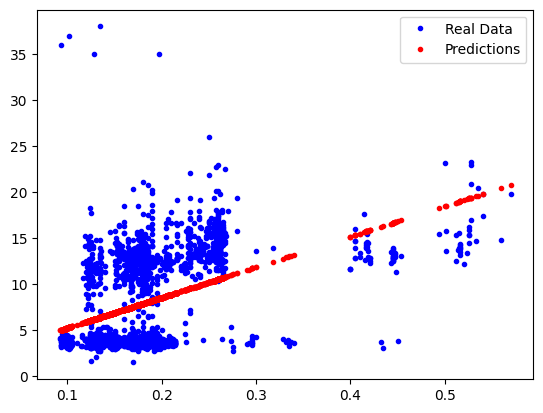

In [233]:
fits(data)

R^2: -0.05103029236087031
mse: 0.032432000432858765


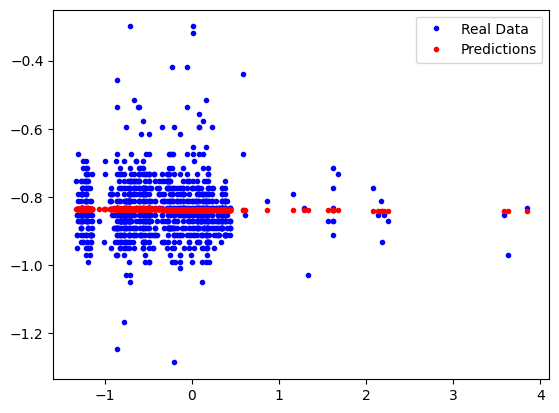

In [234]:
fits(lower_train)

R^2: 0.04697816116117981
mse: 0.08674623853385649


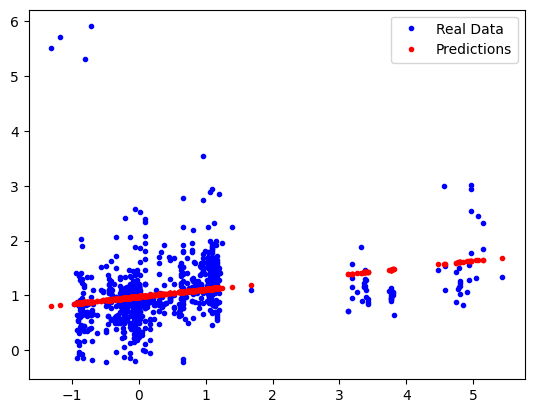

In [235]:
fits(upper_train)

The performance of these models were about the same as the models using temperature.

__Solution to Part 3:__

We tested a couple of the other model fitting methods suggested above. First, we started with KNeighborsRegressor.



In [236]:
# Import library needed for this method
from sklearn.neighbors import KNeighborsRegressor

def fits(data):
    X = ['Temp']
    y = ['MFR']
    method = KNeighborsRegressor(n_neighbors=20)

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())

    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))

    plt.plot(data[X[0]], data[y],'b.', label="Real Data")
    plt.plot(data[X[0]], MFR_pred,'r.', label="Predictions")
    plt.legend()


    return

R^2: -99.10223829688655
mse: 40.488628920381075


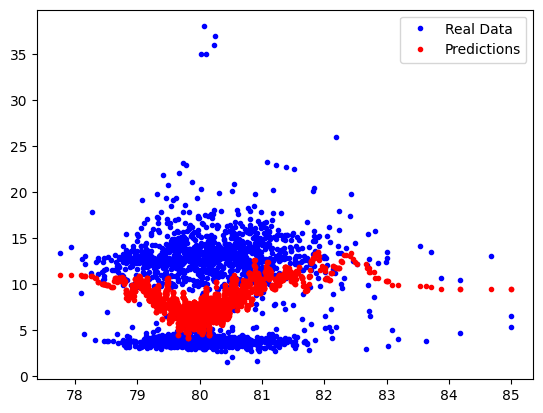

In [237]:
fits(data)

R^2: 0.0049500138641020985
mse: 0.030704597018403695


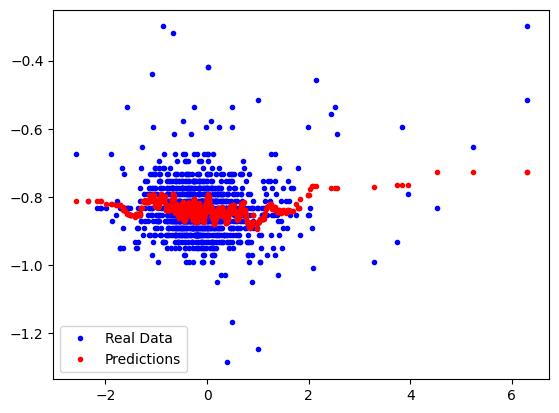

In [238]:
fits(lower_train)

R^2: -0.02371684176872413
mse: 0.09318106021095586


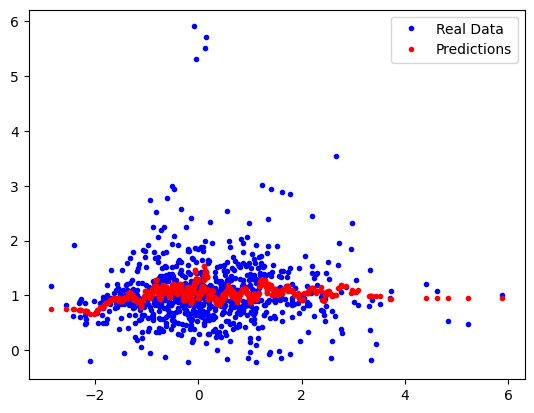

In [239]:
fits(upper_train)

Overall, this did not improve the performance of the models across the three datasets.

We also tried the Lasso method.

In [240]:
def fits(data):
    X = ['Temp']
    y = ['MFR']
    method = linear_model.Lasso()

    model = method.fit(data[X].to_numpy(), data[y].to_numpy())

    MFR_pred = method.predict(data[X].to_numpy())
    r2_model = method.score(data[X].to_numpy(),data['lnMFR'].to_numpy())
    mse_model = mean_squared_error(method.predict(data[X].to_numpy()), data['lnMFR'].to_numpy())

    print('R^2: ' + str(r2_model))
    print('mse: ' + str(mse_model))

    plt.plot(data[X[0]], data[y],'b.', label="Real Data")
    plt.plot(data[X[0]], MFR_pred,'r.', label="Predictions")
    plt.legend()


    return

R^2: -93.31415194440983
mse: 38.14750564010532


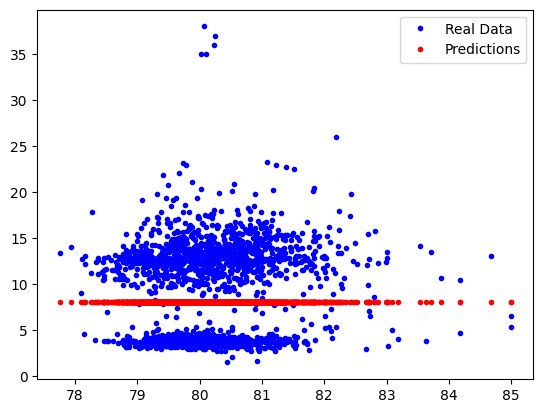

In [241]:
fits(data)

R^2: -0.051088066349843864
mse: 0.03243378318455394


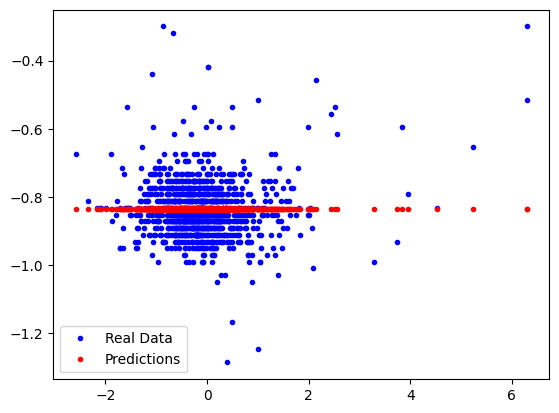

In [242]:
fits(lower_train)

R^2: -0.0212142619023048
mse: 0.09295326963869893


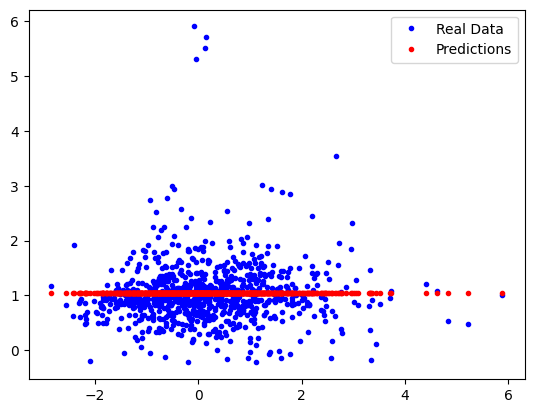

In [243]:
fits(upper_train)

Again, this did not improve the models' performance on the datasets significantly.

__Solution to Part 4:__

When selecting a model based on its performance on testing data, you will likely end up picking whichever model had the best performance. However, while this model performed well on your given testing data, it may not perform well when tested against other datasets or unseen data. Unknowingly, you may have been shortsighted in your choice and overfitted the model to a specific dataset. In addition, it is important to consider the fitting method you are using as factor in choosing your model. If you only base the choice off of performance, you may neglect why the model worked well and why others didn't. For example, we could run countless models here, and pick the best performance without ever considering why a specific model may have performed better and if it can be universally applied to various testing data sets.